# Table of Contents:


1. Introduction
2. Import library
3. Rating distribution
4. Maps
    1. Global Perspective
    2. North America and Europe 
    3. Cities (Las Vegas, Phoenix, Stuttgart, Edinburgh)
    4. Ratings in Las Vegas
5. In-depth Analysis of Reviews
    1. Top 10 Reviewing Users
    2. Tracking elite users
    3. User Summary
6. Registration data
7. User Network
    1. Global Graph
    
8. Network Visulizatioin:
    1. Spring Layout 
    2. Circular/Circos Layout
    3. Random Layout
    4. Kamada-Kawai Layout
9. Community Detection


## Introduction

Yelp is a company that provides crowd-sourced reviews and online booking services for local businesses. Yelp allows users to rate and review various types of local businesses on its platform, including restaurants, cafes, hotels, shops, and more. Users can find and learn about other users' evaluations and reviews of these businesses on Yelp, thereby helping them make more informed  decisions.

The Yelp review dataset is a collection of data gathered from the Yelp platform that includes rich review information, such as ratings, review texts, user information, and business information. By analyzing this data, one can gain a deep understanding of user evaluations and reviews of different types of businesses, obtain valuable insights such as user preferences, and the strengths and weaknesses of businesses, thereby offering targeted suggestions and recommendations for local businesses and users.

This project aims to analyze the Yelp review dataset to explore trends, patterns, and associations within it, in order to mine valuable information from the data, and present the analysis results through visualization, statistics, and network analysis methods. Through such data analysis, we can gain a deeper understanding of user behavior, business situations, and social networks within the Yelp review dataset, providing better services and advice for the Yelp platform and its users.


## Importing libraries

In [1]:
pip install basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 569.1/569.1 kB 13.5 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 49.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 74.9 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 3.9 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 35.1 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install imageio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.4/313.4 kB 7.1 MB/s eta 0:00:0000:01

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install --upgrade networkx matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 31.4 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.8.2
    Uninstalling matplotlib-3.8.2:
      Successfully uninstalled matplotlib-3.8.2

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install folium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 8.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3.11 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
# Import basic packages
import numpy as np
import pandas as pd
import gc  # Memory management
import time  # For timing
import warnings 

# Import Data visulization packages 
import matplotlib.pyplot as plt 
import seaborn as sns 
import matplotlib.gridspec as gridspec  # Matplotlib grid layout library, for creating complex figure layouts
import plotly.offline as pyo  # Plotly offline plotting library, for drawing interactive figures
from plotly.graph_objs import *  # Drawing interactive figures
import plotly.graph_objs as go  # Drawing interactive figures

# Import map_related packages
import imageio  # Image processing library, for handling map images
import folium  # Folium map library, for creating interactive maps
import folium.plugins as plugins  # Folium plugins library, for adding map plugins
from mpl_toolkits.basemap import Basemap  # Basemap library, for drawing maps

# Import graph network-related packages
import networkx as nx  # NetworkX library, for building and analyzing graph networks
import heapq  # heap queue module, for getting the top n elements from list/dictionaries



# 设置
start_time = time.time()  # Get the start time
color = sns.color_palette()  
sns.set_style("darkgrid")  
warnings.filterwarnings("ignore")  
pyo.init_notebook_mode()  

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


### `yelp_review`

This dataset contains reviews posted by Yelp users about business. 
1. `review_id`: Id of the review. 
2. `user_id`: Id of the user. 
3. `business_id`: Id of the business. 
4. `Star`: Star rating of the review. 
5.  `Date`: The date of the review is posted. 
6. `Text`: The content of the review. 
7. `useful`: How many times the review is voted as useful. 
8. `funny`: How many times the review is voted as funny. 
9. `cool`: How many times the review is voted as cool. 

These fields provide information aboout reviews posted by user about each business on yelp. These data can be userful for sentiment analysis. 

### `yelp_tip.csv`

This dataset contains tips posted by Yelp users on business pages, typically including the following fields:

1. `user_id`: The ID of the user who posted the tip
2. `business_id`: The ID of the business the tip is talking about
3. `text`: The text content of the tip
4. `date`: The date and time of the tip
5. `likes`: The number of likes for the tip

These fields provide information about tips posted by Yelp users on the business. This data can be used to explore user behavior and interaction about the business on Yelp. 

###  `yelp_business.csv`

Thus dataset contains information about Yelp businesses, including the following fields:

1. `business_id`: Id of the business
2. `name`: Name of the business
3. `neighborhood`: Neighborhood where business is located
3. `address`: Address of the business
4. `city`: City of the business
5. `state`: State where the business is
6. `postal_code`: The postal code of the business
7. `latitude`: The latitude of the business
8. `longitude`: The longitude of the business
9. `stars`: The rating of the business
10. `review_count `: The number of reviews of the business
11. `is_open`: Whether the business is currently open (0 for closed, 1 is open). 
12. `categories`: Categories of the business. 


These fields provide basic information about Yelp businesses, including name, address, location information, rating, number of reviews, operational status, and category. This data can be used to analyze the performance of businesses on Yelp, explore differences and similarities between businesses, perform geographical analyses, etc., thereby helping users understand the business ecosystem and consumer behavior on Yelp.

### `yelp_business_hours.csv`

This dataset contains information about Yelp business hours, including the following fields:

1. `business_id`: Id of the business, corresponding to the `business_id`in `yelp_business.csv`. 
2. `monday`: Business hours on Monday
3. `tuesday`: Business hours on Tuesday
4. `wednesday`: Business hours on Wednesday
5. `thursday`: Business hours on Thursday
6. `friday`: Business hours on Friday
7. `saturday`: Business hours on Saturday
8. `sunday`: Business hours on Sunday

These fields provide information about the daily business hours of Yelp businesses, which can be used for analyzing business operations, comparing business hours differences between different businesses, conducting analyses on consumer activities within specific time periods, etc. This data can be combined with other business information from the `yelp_business.csv` dataset to more comprehensively understand business operations.


### `yelp_checkin.csv`

This dataset contains information about Yelp user check-in information, including the following fields:

1. `business_id`: Business id
2. `weekday`: The day of user check-in in a week. 
3. `hour`: The hour of user check-in, in the format "HH:MM". 
4. `checkins`: The number of checkin by users. 

This dataset records the date and time information of Yelp user check-ins at businesses. This data can be used to analyze user check-in activity, distribution of check-in times, check-in situations of different businesses, etc., thereby helping businesses better understand user behavior and optimize operational strategies.

This data can be combined with other business information from the `yelp_business.csv` dataset to more comprehensively understand business user check-in situations and help businesses make more data-supported business decisions.


### `yelp_user.csv`

This dataset contains information about Yelp users, including the following fields:

1. `user_id`: Id of the user
2. `name`: User name 
3. `review_count`: The number of reviews posted by the user
4. `yelping_since`: The date and user registered in yelp, in the format of "YYYY-MM-DD"
5. `friends`: The user's friends list. 
6. `useful`: The number of times the user was rated "useful' by other users. 
7. `funny`: The number of times the user was rated "funny" by other users. 
8. `cool`: The number of times the user was rated "cool" by other users
9. `fans`: The number of fans following the user. 
10. `elite`: The user's elite membership status, indicating whether the user has been a Yelp elite member and lists the specific years
11. `average_stars`: The average rating given by the user
12. `compliment_hot`: The number of "hot" compliments received by the user
13. `compliment_more`: The number of "more" compliments received by the user
14. `compliment_profile`: The number of "profile" compliments received by the user
15. `compliment_cute`:  The number of "cute" compliments received by the user
16. `compliment_list`: The number of "list" compliments received by the user
17. `compliment_note`: The number of "note" compliments received by the user
18. `compliment_plain`: The number of "plain" compliments received by the user
19. `compliment_cool`: The number of "cool" compliments received by the user
20. `compliment_funny`: The number of "funny" compliments received by the user
21. `compliment_writer`: The number of "writer" compliments received by the user
22. `compliment_photos`: The number of "photos" compliments received by the user





### Import csv

In [2]:
business=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_business.csv')
business_hours=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_business_hours.csv')
check_in=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_checkin.csv')
reviews=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_review.csv')
tip=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_tip.csv')
user=pd.read_csv('/Users/yupengshen/DA_portfolio/yelp/yelp_data/yelp_user.csv')

## Rating distribution

The following code draws a bar chart using the barplot() function from the seaborn library, showing the distribution of the number of businesses with different star ratings.

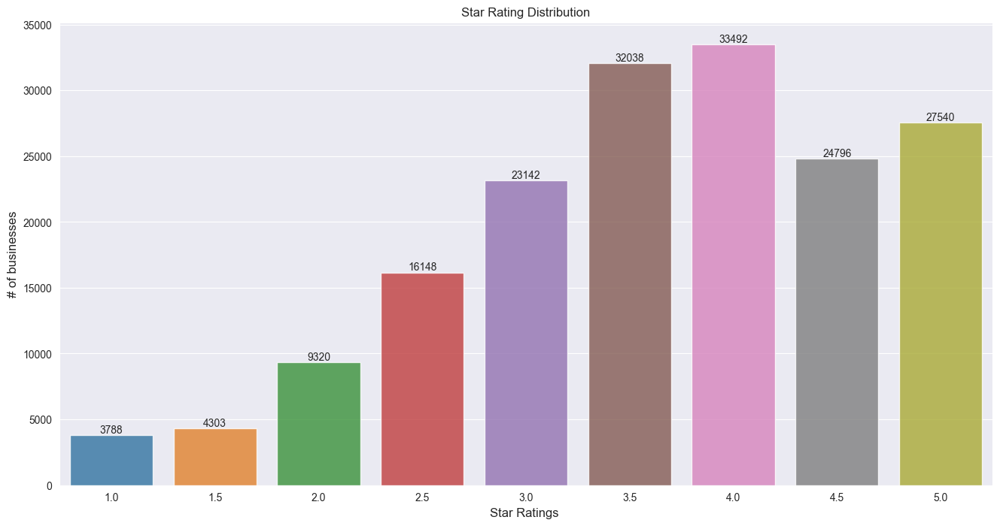

In [3]:

x = business['stars'].value_counts()  
x = x.sort_index() 


plt.figure(figsize=(16,8)) 
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8) 
plt.title("Star Rating Distribution") 
plt.ylabel('# of businesses', fontsize=12) 
plt.xlabel('Star Ratings ', fontsize=12) 


rects = ax.patches 
labels = x.values  
for rect, label in zip(rects, labels): 
    height = rect.get_height() 
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom') 

plt.show() 

The following code draws a bar chart using the barplot() function from the seaborn library, displaying the distribution of popular business categories and their quantities on Yelp.

In [4]:
''.join(business['categories']).split(';')

['Dentists',
 'General Dentistry',
 'Health & Medical',
 'Oral Surgeons',
 'Cosmetic Dentists',
 'OrthodontistsHair Stylists',
 'Hair Salons',
 "Men's Hair Salons",
 'Blow Dry/Out Services',
 'Hair Extensions',
 'Beauty & SpasDepartments of Motor Vehicles',
 'Public Services & GovernmentSporting Goods',
 'ShoppingAmerican (New)',
 'Nightlife',
 'Bars',
 'Sandwiches',
 'American (Traditional)',
 'Burgers',
 'RestaurantsItalian',
 'RestaurantsReal Estate Services',
 'Real Estate',
 'Home Services',
 'Property ManagementShopping',
 'Sporting GoodsCoffee & Tea',
 'Ice Cream & Frozen Yogurt',
 'FoodAutomotive',
 'Auto DetailingBreakfast & Brunch',
 'Gluten-Free',
 'Coffee & Tea',
 'Food',
 'Restaurants',
 'SandwichesLocal Services',
 'Self StorageBakeries',
 'Bagels',
 'FoodGeneral Dentistry',
 'Dentists',
 'Endodontists',
 'Cosmetic Dentists',
 'Health & Medical',
 'OrthodontistsRestaurants',
 'American (Traditional)Italian',
 'French',
 'RestaurantsBeauty & Spas',
 'Nail SalonsTires',
 'O

Yelp has  59108 different type of business


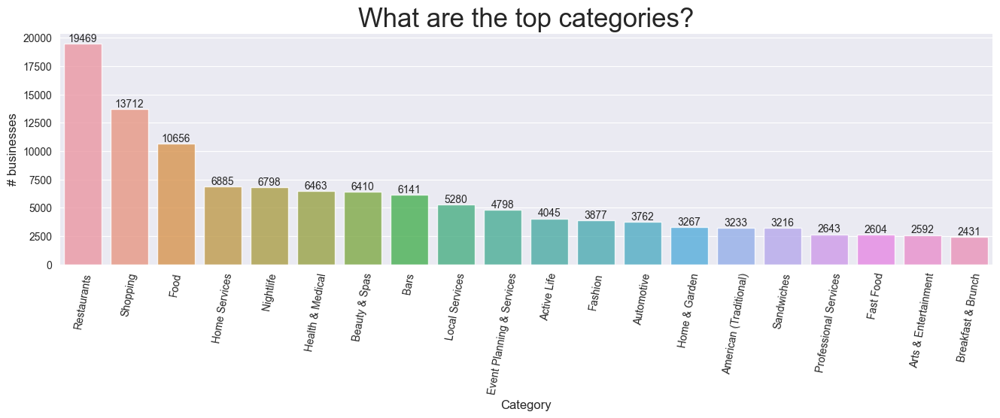

In [5]:
# Extract all business categories
business_cats = ''.join(business['categories'])

# Split the business categories into separate categories and store them in a dataframe
cats = pd.DataFrame(business_cats.split(';'), columns=['category']) 
x = cats.category.value_counts()
print("Yelp has ", len(x), "different type of business")

# Prepare the data for the bar chart 
x = x.sort_values(ascending=False)
x = x.iloc[0:20]  # Extract the top 20

# Bar plot 
plt.figure(figsize=(16,4)) 
ax = sns.barplot(x = x.index, y = x.values, alpha=0.8)
plt.title("What are the top categories?", fontsize=25)
locs, labels = plt.xticks() 
plt.setp(labels, rotation=80)
plt.ylabel('# businesses', fontsize=12) 
plt.xlabel('Category', fontsize=12)

# Add label text 
rects = ax.patches
labels = x.values 
for rect, label in zip(rects, labels):
    height = rect.get_height() 
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show() 

## Map Section

### Analysis of Reviews from different location. 

In the map section, I will analyze the various `business` based on `geographical locations`. 

1. First, I will take a look at a `global view` of Yelp business. 
2. Then, we zoom in on the two `most concentrated areas` (North America and Europe)
3. Explore the `cities with the most reviews`
4. Visualize the `top two`ranked cities

In [6]:
from mpl_toolkits.basemap import Basemap

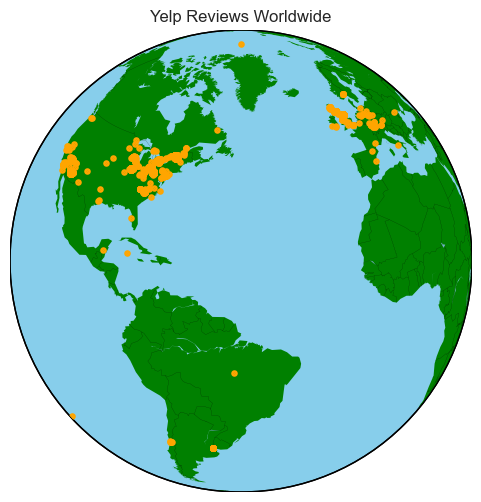

In [7]:

plt.figure(1, figsize=(15,6))

# Generate a globe-like map using the orthographic projection
m1 = Basemap(projection='ortho', lat_0=20, lon_0=-50)

# fill continents with color
m1.fillcontinents(color='green', lake_color='#87CEEB')

# Add ocean boundaries with color
m1.drawmapboundary(fill_color='#87CEEB')

# Draw countries boarderline 
m1.drawcountries(linewidth=0.1, color="black")

# Plot the location of businesses using scatter plot with longitude and latitude
mxy = m1(business["longitude"].tolist(), business["latitude"].tolist())
m1.scatter(mxy[0], mxy[1], s=3, c="orange", lw=3, alpha=1, zorder=5)

# Add title lable
plt.title("Yelp Reviews Worldwide")


plt.show()

### North America and Europe

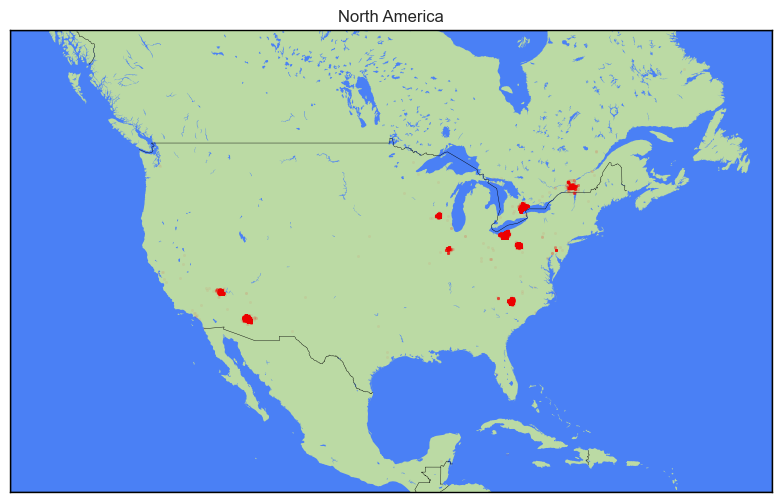

In [8]:
# Longitude and lagtitude for North America
lon_min, lon_max = -140.0, -50.0
lat_min, lat_max = 15.0, 57.0


# Create selecter to see if those restaurant are in the North America
idx_NA = (business["longitude"] > lon_min) & \
         (business["longitude"] < lon_max) & \
         (business["latitude"] > lat_min) & \
         (business["latitude"] < lat_max)
# Apply the selector to filter a subset 
NA_business = business[idx_NA]

# Initialize the plot
plt.figure(figsize=(12, 6))
m2 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m2.fillcontinents(color='#bbdaa4', lake_color='#4a80f5')
m2.drawmapboundary(fill_color='#4a80f5') 
m2.drawcountries(linewidth=0.3, color="black")

# Plot the data
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=5, c="red", lw=0, alpha=0.05, zorder=5)

plt.title("North America")
plt.show()

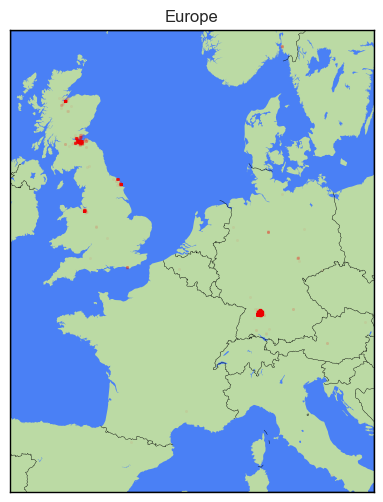

In [9]:
# Longitude and lagtitude for North America
lon_min, lon_max = -8, 17
lat_min, lat_max = 40, 60


# Create selecter to see if those restaurant are in the North America
idx_euro = (business["longitude"] > lon_min) & \
         (business["longitude"] < lon_max) & \
         (business["latitude"] > lat_min) & \
         (business["latitude"] < lat_max)
# Apply the selector to filter a subset 
euro_business = business[idx_euro]

# Initialize the plot
plt.figure(figsize=(12, 6))
m3 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

m3.fillcontinents(color='#bbdaa4', lake_color='#4a80f5')
m3.drawmapboundary(fill_color='#4a80f5') 
m3.drawcountries(linewidth=0.3, color="black")

# Plot the data
mxy = m3(euro_business["longitude"].tolist(), euro_business["latitude"].tolist())
m3.scatter(mxy[0], mxy[1], s=5, c="red", lw=0, alpha=0.05, zorder=5)

plt.title("Europe")
plt.show()

### City View(Las Vegas, Phoenis, Stuttgart, Edinburgh)

Next, we explore the appearance of 4 cities (Las Vegas, Phoenix, Stuttgart, Edinburgh) by plotting their geographical coordinates on a map. 

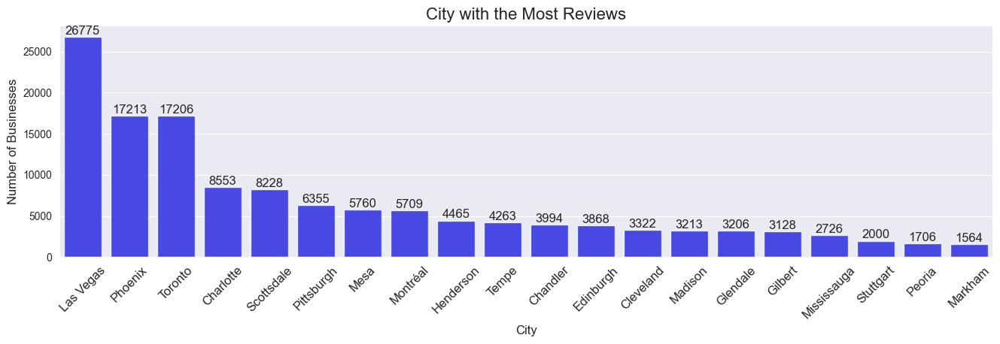

In [10]:
# Getting the number of ratings per city
x = business['city'].value_counts()
x = x.sort_values(ascending=False)
x = x.iloc[0:20]

# Plotting the bar chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x = x.index, y = x.values, alpha=0.8,color='blue')
plt.title("City with the Most Reviews", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Number of Businesses', fontsize=12)
plt.xlabel('City', fontsize=12)

rects = ax.patches
labels = x.values 

# Add labels above each bar 
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize=12) # 添加数字标签，设置位置、对齐方式和字体大小

plt.show()

In [11]:
# Retrieve data columns related to ratings
rating_data = business[['latitude', 'longitude', 'stars', 'review_count']]
# Create a custom column 'popularity' calculated as the rating times the number of reviews
rating_data['popularity'] = rating_data['stars'] * rating_data['review_count']

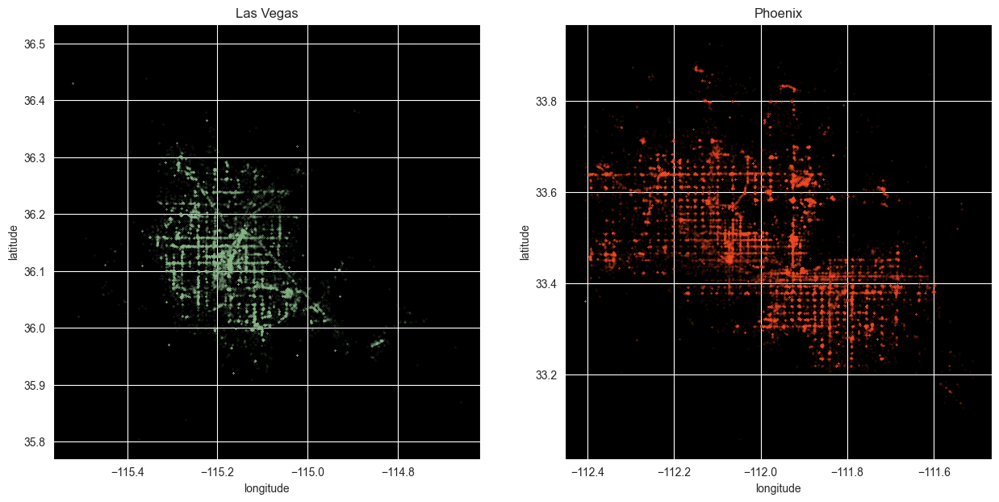

In [12]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Center of Las Vegas
lat = 36.1699
lon = -115.1398
# Obtain Lat and Lon of entire Las Vegas
lon_min, lon_max = lon - 0.4, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter out data for Las Vegas based on those range
ratings_data_vegas = rating_data[(rating_data["longitude"] > lon_min) &
                                (rating_data["longitude"] < lon_max) &
                                (rating_data["latitude"] > lat_min) &
                                (rating_data["latitude"] < lat_max)]

# Plot the scatter plot for Las Vegas
ratings_data_vegas.plot(kind='scatter', x='longitude', y='latitude',
                       color='#8FBC8F',
                       s=.02, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Las Vegas") 
ax1.set_facecolor('black')

# Center of Phoenix
lat = 33.435463
lon = -112.006989
# Obtain Lat and Lon of entire Phoenix
lon_min, lon_max = lon - 0.4, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5
# Filter out data for Phoenix based on the latitude and longitude range
ratings_data_phoenix = rating_data[(rating_data["longitude"] > lon_min) &
                                  (rating_data["longitude"] < lon_max) &
                                  (rating_data["latitude"] > lat_min) &
                                  (rating_data["latitude"] < lat_max)]
# Plot the scatter plot for Phoenix
ratings_data_phoenix.plot(kind='scatter', x='longitude', y='latitude',
                         color='#fb4e29',
                         s=.02, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Phoenix") 
ax2.set_facecolor('black') 

f.show() 

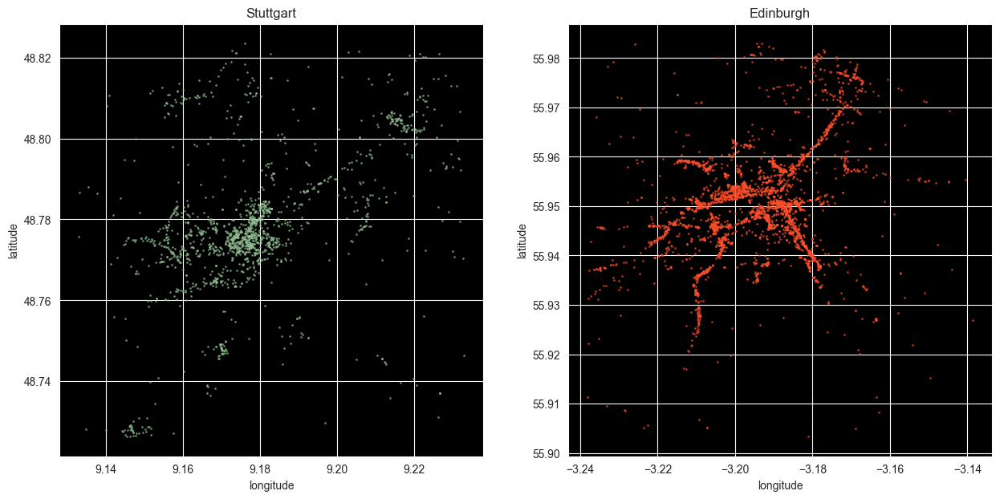

In [13]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Center of Stuttgart
lat = 48.7758
lon = 9.1829
# Obtain Lat and Lon of entire Las Vegas
lon_min, lon_max = lon - 0.05, lon + 0.05
lat_min, lat_max = lat - 0.05, lat + 0.05
# Filter out data for Las Vegas based on those range
ratings_data_stuttgart = rating_data[(rating_data["longitude"] > lon_min) &
                                (rating_data["longitude"] < lon_max) &
                                (rating_data["latitude"] > lat_min) &
                                (rating_data["latitude"] < lat_max)]

# Plot the scatter plot for Las Vegas
ratings_data_stuttgart.plot(kind='scatter', x='longitude', y='latitude',
                       color='#8FBC8F',
                       s=1, alpha=.6, subplots=True, ax=ax1)
ax1.set_title("Stuttgart") 
ax1.set_facecolor('black')

# Center of Edinburgh
lat = 55.9533
lon = -3.1883
# Obtain Lat and Lon of entire Phoenix
lon_min, lon_max = lon - 0.05, lon + 0.05
lat_min, lat_max = lat - 0.05, lat + 0.05
# Filter out data for Phoenix based on the latitude and longitude range
ratings_data_Edin = rating_data[(rating_data["longitude"] > lon_min) &
                                  (rating_data["longitude"] < lon_max) &
                                  (rating_data["latitude"] > lat_min) &
                                  (rating_data["latitude"] < lat_max)]
# Plot the scatter plot for Phoenix
ratings_data_Edin.plot(kind='scatter', x='longitude', y='latitude',
                         color='#fb4e29',
                         s=1, alpha=.6, subplots=True, ax=ax2)
ax2.set_title("Edinburgh") 
ax2.set_facecolor('black') 

f.show() 

U.S cities often have orderly blocks or grid structures, while other cities might exhibit more fluid and irregular designs. By visualizing the location information of businesses on a map, we can gain a deeper understanding of the distribution of economic activities and business clusters in different urban areas. This method can reveal spatial patterns and trends within urban areas in an intuitive and engaging way, which is very valuable for urban planning, policy-making, and business decisions. Through data visualization, we can explore and understand the complex spatial relationships within urban areas visually, thereby better comprehending the development and changes of cities.

### Las Vegas Ratings

Let's take a look at how people rate `different businesses in Las Vegas`.

Below is an `interactive animation`, where we used the  Folium package to create stunning Leaflet map visuals.In this animation, we display highlighted business based on star ratings. The goal is to see if there are certain hotspots/concentrations of great restaurants. 

It turns out that **good businesses and bad businesses are quite evenly dispersed throughout the city.**

In [14]:
data=[]
# Rearrange data to fit the format required  by Folium
stars_list=list(rating_data['stars'].unique())
for star in stars_list: 
    subset=ratings_data_vegas[ratings_data_vegas['stars']==star]
    data.append(subset[['latitude','longitude']].values.tolist())
# Initialize the map's center coordinates and zoom level
lat = 36.1699
lon = -115.1398
zoom_start=11
print("Vegas Review heatmap Animation ")

# create a basic Folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMap with time plugin to create a heatmap with dynamic time changes
hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True,radius=7)
hm.add_to(m)
m 


Vegas Review heatmap Animation 


### Phoenix Ratings

Let's take a look at how people rate `different businesses in Phoenix`.


Restaurants are distributed more evenly in Phoenix and its surrounding cities, including Scottsdale, Tempe, and Mesa. It cannot be said that all the top-quality restaurants are located downtown, nor are the lesser-rated ones confined to the suburbs. The geographical location does not significantly influence the star ratings of restaurants.

In [15]:
data=[]
# Rearrange data to fit the format required  by Folium
stars_list=list(rating_data['stars'].unique())
for star in stars_list: 
    subset=ratings_data_phoenix[ratings_data_phoenix['stars']==star]
    data.append(subset[['latitude','longitude']].values.tolist())
# Initialize the map's center coordinates and zoom level
lat = 33.435464
lon = -112.006989
zoom_start=11
print("Phoenix Review heatmap Animation ")

# create a basic Folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMap with time plugin to create a heatmap with dynamic time changes
hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True,radius=7)
hm.add_to(m)
m 

Phoenix Review heatmap Animation 


### Edinburgh Ratings

Let's take a look at how people rate `different businesses in Ediburgh`.

In Europe, restaurants tend to be more concentrated in downtown areas or city centers. For instance, a higher number of restaurants can be found in the heart of Edinburgh and along major roads like A90, A199, and A772 leading out of the city.


In [16]:
data=[]
# Rearrange data to fit the format required  by Folium
stars_list=list(rating_data['stars'].unique())
for star in stars_list: 
    subset=ratings_data_Edin[ratings_data_Edin['stars']==star]
    data.append(subset[['latitude','longitude']].values.tolist())
# Initialize the map's center coordinates and zoom level
lat = 55.9533
lon = -3.1883
zoom_start=11
print("Edinburgh Review heatmap Animation ")

# create a basic Folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMap with time plugin to create a heatmap with dynamic time changes
hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True,radius=7)
hm.add_to(m)
m 

Edinburgh Review heatmap Animation 


### Stuttgart Ratings

Let's take a look at how people rate `different businesses in Stuttgart`.

Stuttgart exhibits a pattern similar to Edinburgh, with restaurants mainly clustered in the downtown area.

In [17]:
data=[]
# Rearrange data to fit the format required  by Folium
stars_list=list(rating_data['stars'].unique())
for star in stars_list: 
    subset=ratings_data_stuttgart[ratings_data_stuttgart['stars']==star]
    data.append(subset[['latitude','longitude']].values.tolist())
# Initialize the map's center coordinates and zoom level
lat = 48.7758
lon = 9.1829
zoom_start=11
print("Stuttgart Review heatmap Animation ")

# create a basic Folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)
# Use the HeatMap with time plugin to create a heatmap with dynamic time changes
hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True,radius=7)
hm.add_to(m)
m 

Stuttgart Review heatmap Animation 


## Analysis of review

Let's look at the top-ranked users based on the number of reviews they have given. 

Below code group and aggregate a `reviews` DataFrame by the 'user_id' column and calculates the results of multiple aggregation functions.

Specifically, the groupby method is used to group the reviews DataFrame by the 'user_id' column. Then, the agg method applies several aggregation functions to each group, including 'count', 'min', 'max', 'sum', 'mean', etc., calculating the following metrics:

- 'review_id': 'count', which calculates the number of reviews for each user;
- 'date': 'min' and 'max', which respectively calculate the minimum and maximum review dates for each user;
- 'useful': 'sum', which calculates the total sum of the 'useful' column for each user's reviews;
- 'funny': 'sum', which calculates the total sum of the 'funny' column for each user's reviews;
- 'cool': 'sum', which calculates the total sum of the 'cool' column for each user's reviews;
- 'stars': 'mean', which calculates the average value of the 'stars' column for each user's reviews.
The aggregated results are saved in a new DataFrame named `user_agg`, containing the outcomes of each aggregation function. This allows for a summary and statistical analysis of each user's review data, facilitating further data analysis and visualization.

In [18]:
user.shape

(1326100, 22)

In [19]:
# Dataset is too big, so i'm sampling 100,000 records. 
user_agg=reviews.sample(100000).groupby('user_id').agg(
            {'review_id':['count'],
             'date':['min','max'],
             'useful':['sum'],
             'funny':['sum'],
             'cool':['sum'],
             'stars':['mean']})

In [20]:
user_agg=user_agg.sort_values([('review_id','count')],ascending=False)
print("Top 10 Users in Yelp")
user_agg.head(10)

Top 10 Users in Yelp


review_id        date             useful funny cool  \
                           count         min         max    sum   sum  sum   
user_id                                                                      
CxDOIDnH8gp9KXzpBHJYXw        70  2009-11-09  2017-12-05    221   120  131   
bLbSNkLggFnqwNNzzq-Ijw        42  2013-05-02  2016-11-01    450   259  326   
QJI9OSEn6ujRCtrX06vs1w        37  2010-05-06  2016-05-01    217   106  162   
dIIKEfOgo0KqUfGQvGikPg        30  2007-12-11  2017-10-04    298   142  249   
PKEzKWv_FktMm2mGPjwd0Q        29  2010-10-12  2016-12-09    218    82  144   
UYcmGbelzRa0Q6JqzLoguw        28  2010-12-31  2016-12-22    190    98  154   
ELcQDlf69kb-ihJfxZyL0A        27  2012-02-29  2017-09-18     38    26   21   
d_TBs6J3twMy9GChqUEXkg        26  2011-01-28  2017-11-14     92    40   43   
qewG3X2O4X6JKskxyyqFwQ        23  2010-01-09  2012-11-06    391   164  257   
S9Jw00eZHVj5_0sOM_C5Rg        23  2010-04-25  2016-03-29     32     9   24   

                           stars  
                            mean  
user_id                           
CxDOIDnH8gp9KXzpBHJYXw  3.285714  
bLbSNkLggFnqwNNzzq-Ijw  3.309524  
QJI9OSEn6ujRCtrX06vs1w  3.621622  
dIIKEfOgo0KqUfGQvGikPg  3.833333  
PKEzKWv_FktMm2mGPjwd0Q  3.482759  
UYcmGbelzRa0Q6JqzLoguw  3.321429  
ELcQDlf69kb-ihJfxZyL0A  2.592593  
d_TBs6J3twMy9GChqUEXkg  3.461538  
qewG3X2O4X6JKskxyyqFwQ  4.000000  
S9Jw00eZHVj5_0sOM_C5Rg  3.565217

Reviews could be randomly selected from all reviews

### Tracking high-value users

Let's track the top-ranked users from the review dataset.

To do this, we created a map of all the places they have visited in chronological order and then generated a heatmap animation from it.

In [21]:
# Track high-value users
top_user_reviews = reviews[reviews['user_id'] == 'CxDOIDnH8gp9KXzpBHJYXw']
# Obtain location information
top_user_locs = pd.merge(top_user_reviews, business, on='business_id')
# Get date list 
date_list = list(top_user_locs['date'].unique())
# Reorganize data to fit Folium 
data = []
for date in date_list:
    subset = top_user_locs[top_user_locs['date'] == date]
    df = subset[['latitude', 'longitude', 'date']]
    data.append(subset[['latitude', 'longitude']].values.tolist())

In [22]:
top_user_locs['latitude'].mean(), top_user_locs['longitude'].mean()
# The location is around GTA area


(43.806380381039205, -79.20525986940686)

In [23]:
# Initialize the map with the initial position set to Toront, Ontario, Canada, with the latitude and longitude being 43.860397 and -79.303184, 
# respectively, and the initial zoom level set to 9.
lat = 43.65107
lon = -79.347015
zoom_start = 9
print("The top User")

m = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=zoom_start)


hm = plugins.HeatMapWithTime(data, max_opacity=0.3, auto_play=True, display_index=True)
hm.add_to(m) 
m 


The top User


"Rating with Increasing 'Useful'":

This regression plot shows the trend of the highest rating (stars) as the number of 'useful' marks in reviews increases.

The x-axis represents the thresholds of 'useful' marks, ranging from 100 to 1000, with intervals of 20;

The y-axis shows the values of the highest ratings at the corresponding thresholds. The chart can help us understand the relationship between the number of 'useful' marks and the highest ratings.

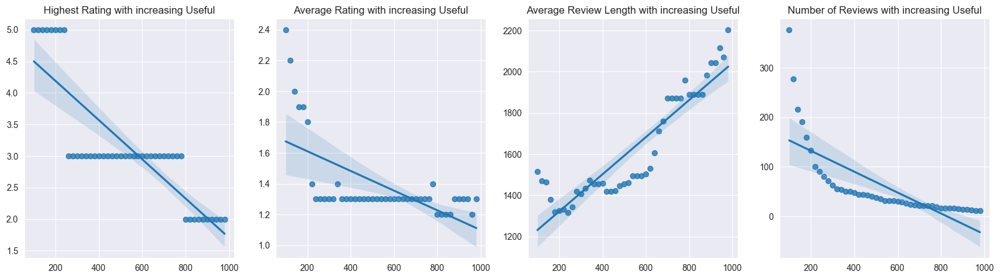

In [24]:
reviews = reviews.query('useful>0 and funny>0 and cool>0')

thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('useful>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('useful>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('useful>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('useful>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Highest Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Useful')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Useful')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Useful')

"Rating with Increasing 'Funny'":

This regression plot shows the trend of the highest rating (stars) as the number of 'Funny' marks in reviews increases.

The x-axis represents the thresholds of 'Funny' marks, ranging from 100 to 1000, with intervals of 20;

The y-axis shows the values of the highest ratings at the corresponding thresholds. The chart can help us understand the relationship between the number of 'Funny' marks and the highest ratings.

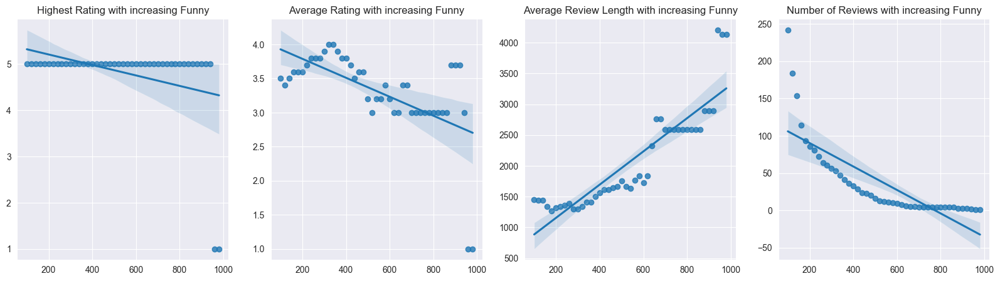

In [25]:
thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('funny>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('funny>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('funny>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('funny>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Highest Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Funny')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Funny')

"Rating with Increasing 'Cool'":

This regression plot shows the trend of the highest rating (stars) as the number of 'Cool' marks in reviews increases.

The x-axis represents the thresholds of 'Cool' marks, ranging from 100 to 1000, with intervals of 20;

The y-axis shows the values of the highest ratings at the corresponding thresholds. The chart can help us understand the relationship between the number of 'Cool' marks and the highest ratings.

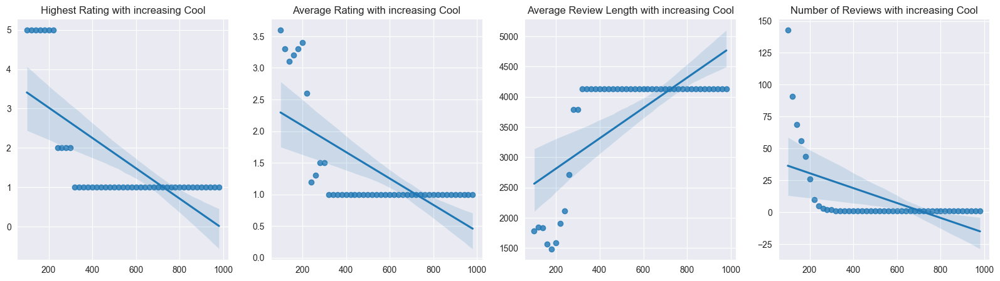

In [26]:
thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('cool>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('cool>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('cool>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('cool>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Highest Rating with increasing Cool')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Cool')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Cool')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Cool')

### Sentiment Analysis

In [27]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [28]:
from textblob import TextBlob

In [29]:
elite_review_sentiment_score_2012 = reviews.merge(user[user['elite'] != 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

regular_review_sentiment_score_2012 = reviews.merge(user[user['elite'] == 'None']['user_id'])\
.query("date.str.startswith('2012')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

- -1.0: Extremely negative sentiment
- -0.5: Negative sentiment
- 0.0: Neutral sentiment
- 0.5: Positive sentiment
- 1.0: Extremely positive sentiment

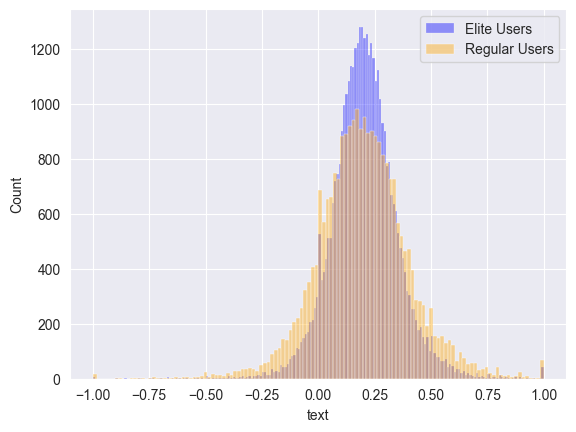

In [30]:
# Plot the histogram for elite user reviews and assign a label
ax1 = sns.histplot(elite_review_sentiment_score_2012, alpha=0.4, label='Elite Users', color='blue')

# Plot the histogram for regular user reviews, using the same axis ax1 and assign a label
ax2 = sns.histplot(regular_review_sentiment_score_2012, alpha=0.4, label='Regular Users', color='orange', ax=ax1)

# Add the legend to the plot
plt.legend()

# Show the plot
plt.show()


Sentiment analysis polarity scoring is conducted separately for elite and regular users' reviews, revealing the overall polarity distribution. Elite users' reviews are more concentrated around 0.25, indicating a positive bias.

Next, we'll examine the keyword distribution for reviews with polarity greater than 0.25 or less than -0.25, and create word clouds for each.

In [31]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [32]:
import wordcloud

In [33]:
def senti_word_cloud(s,max_words = 200):
    from wordcloud import WordCloud
    plt.rcParams['figure.figsize'] = (20,10)
    # color_mask =imageio.imread("1.png")
    wc1 = WordCloud(background_color="black",
            max_words=max_words,  
            width=1920, height=1080
            )

    wc2 = WordCloud(background_color="white",
            max_words=max_words, 
            width=1920, height=1080
            ) 

    positivelist = []
    negativelist = []

    from textblob import TextBlob
    for each in s:
        each_word = TextBlob(each)
        feeling = each_word.sentiment.polarity
        if feeling > 0.25:
            positivelist.append(each)
        elif feeling < -0.25:
            negativelist.append(each)
        else:
            pass
    

    positive_string = " ".join(positivelist)
    negative_string = " ".join(negativelist)


    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    wc1.generate(negative_string)
    axes[0].imshow(wc1, interpolation='bilinear')
    axes[0].set_title('Negative')
    axes[0].axis('off')

    wc2.generate(positive_string)
    axes[1].imshow(wc2, interpolation='bilinear')
    axes[1].set_title('Positive')
    axes[1].axis('off')

    plt.show()

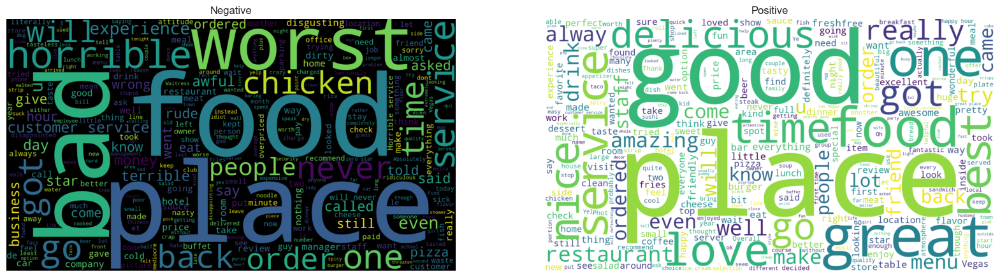

In [34]:
senti_word_cloud(reviews['text'].sample(20000),max_words = 300)

### User summary stats:

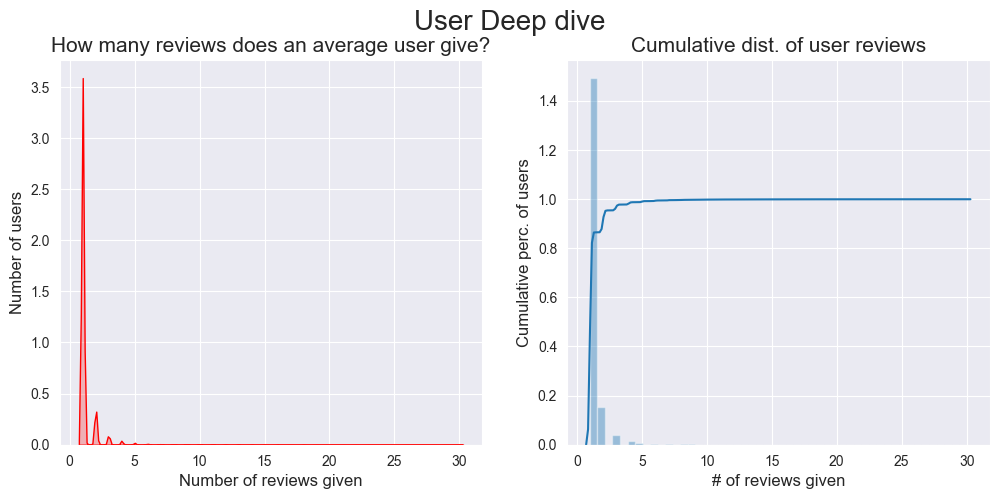

In [35]:
# Cap max reviews to 30 for better visuals
user_agg[('review_id','count')].loc[user_agg[('review_id','count')]>30] = 30
plt.figure(figsize=(12,5))
plt.suptitle("User Deep dive",fontsize=20)
gridspec.GridSpec(1,2)
plt.subplot2grid((1,2),(0,0))
#Cumulative Distribution
ax=sns.kdeplot(user_agg[('review_id','count')],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('Number of reviews given', fontsize=12)
plt.ylabel('Number of users', fontsize=12)

#Cumulative Distribution
plt.subplot2grid((1,2),(0,1))
sns.distplot(user_agg[('review_id','count')],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)


plt.show()



80% of the users write only about 2 reviews

## Registration data

-  `highlight_max`函数

The `highlight_max` function is a Python function used to highlight the maximum value in a pandas Series or DataFrame.

-  Parameters
    - `data`：A pandas Series or DataFrame in which the maximum value needs to be highlighted.
    - `color`: An optional parameter used to specify the color for highlighting the maximum value. The default is 'yellow'.



In [36]:
def highlight_max(data, color='yellow'):
    '''
    highlight the maximum in a Series or DataFrame
    '''
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                
                            index=data.index, columns=data.columns)

In [37]:
#checkins exploration

# Group the check-in data by 'weekday' and 'hour', and calculate the sum of 'checkins' for each group.
df = check_in.groupby(['weekday', 'hour'])['checkins'].sum()

# Reset the index, converting the grouped results back into a DataFrame.
df = df.reset_index()

# Create a DataFrame using 'hour' as the row index, 'weekday' as the column index, and the values of 'checkins'.
df = df.pivot(index='hour', columns='weekday')[['checkins']]

# Remove the extra level of column labels.
df.columns = df.columns.droplevel()

# Reset the row index.
df = df.reset_index()

# Process the 'hour' column, converting it into an integer type.
#A lambda function and the split method are used here to remove the minute part from the time string.

df.hour = df.hour.apply(lambda x: str(x).split(':')[0])
df.hour = df.hour.astype(int)

# Sort based on hour
df = df.sort_values('hour')

# Rearrange the order of the columns, placing the 'hour' column first.
df = df[['hour', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']]


cm = sns.light_palette("orange", as_cmap=True)

#Use the custom function highlight_max to highlight the maximum value in each column, with the color blue.
df.style.apply(highlight_max, color='#679bff',axis=0)


weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun
0,0,163336,156195,166254,171669,178666,224425,225209
11,1,161168,162632,174696,181712,190371,245453,235295
16,2,140252,141732,153923,160906,169989,236195,224716
17,3,106422,103584,111840,117639,127783,189242,184979
18,4,73497,68950,72821,76283,86825,138952,140092
19,5,48253,42977,44109,42130,55672,97062,101133
20,6,31624,26646,27175,27108,36546,68465,72404
21,7,23022,18946,19195,20672,26551,49633,52890
22,8,15327,12452,12484,13830,18004,33591,35079
23,9,11000,8837,8814,10058,12683,21969,21524


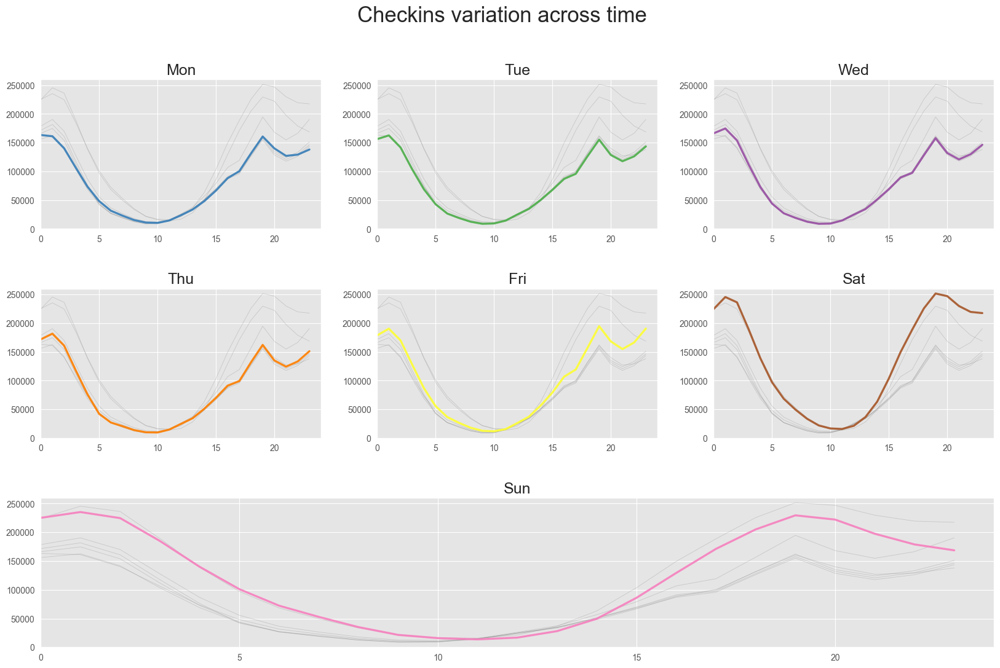

In [38]:
plt.style.use('ggplot')


palette = plt.get_cmap('Set1')

plt.figure(figsize=(20,12))

plt.suptitle("Checkins variation across time", fontsize=25)

gridspec.GridSpec(3,3)


plt.subplots_adjust(hspace=0.4)

# Draw discrete grey line charts representing trends for all groups
num = 0
for column in df.drop('hour', axis=1):
    num += 1


    if num == 7:  # 调整以适应星期日的位置
        plt.subplot2grid((3,3), (2,0), colspan=3)
    else:
        plt.subplot(3,3, num)

    # Draw labeled line charts representing trends for a specific group
    for v in df.drop('hour', axis=1):
        plt.plot(df['hour'], df[v], marker='', color='grey', linewidth=0.6, alpha=0.3)

    
    plt.plot(df['hour'], df[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)

    plt.xlim(0,24)

    plt.ylim(-2,260000)

  
    if num in range(4) :
        plt.tick_params(labelbottom='off')


    if num not in [1,4,7] :
        plt.tick_params(labelleft='off')


    plt.title(column, loc='center', fontsize=18, fontweight=0)

## User Network
The user table contains a list of users and their friends. Let's try to make a network. 


### Global Graph

In [39]:
# Filter for a subset of users with at least one friend
subset_users = user[user['friends'] != 'None']

# Filter for a subset of users who have given at least 10 reviews
subset_users = subset_users[subset_users['review_count'] >= 10]

# Split the values in the "friends" column and create a new "list_friends" column
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))

# Select only the "user_id" and "list_friends" columns
subset_users = subset_users[['user_id','list_friends']]

# Due to space limitations, limit the DataFrame to the first 6000 rows
subset_users = subset_users.iloc[0:6000]



In [40]:
subset_users

,user_id,list_friends
0,JJ-aSuM4pCFPdkfoZ34q0Q,"[0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19G..."
18,jYnkJR3T8yCERXywoVhWYA,"[hkXekeW_Jj6mIy8r8N7r1Q, dQDpV-VUtwYGqHznuRV-..."
44,fV8Yr0c5tFQTQ2SRRJHXHw,"[HDb4fBWIAQ-foS8qLJty9w, x0hBZsmBTYxhjjx0MShz..."
74,aw973Pm1nrTbRjP4zY9B9g,"[Cit5yho-DqotA0BnXHErTQ, bm2DqfP4P454FjEtCbZd..."
90,pzpbr9mlagHhDRdin8DvPQ,"[PZbPhdy0_08tHprIJiZ4uw, i4dhajw93ZDmIa89n6-w..."
...,...,...
16388,ACoPI_3K8OwBHrli271zbQ,"[Yi8LctBGqLL2ZDfd2jcmqA, KOVc1bOGPzbzqaNkMdxf..."
16514,LVtiHvoEwCPVtZWSbszXXw,"[caICV2psm7OABEkikMx2vw, htmeKcGYnySh5lQTUaVz..."
16516,Ob5Voi1emV_ED7Zrl40H1Q,"[EXLdQF19ma7m2YR9RX9OZA, 5NDk-q5mv8PIDvz83HwM..."
16517,M5SmOGGGOk7jF4RtCny49Q,[mpUmQh7uEX0hysp1qw72yA]


In [41]:
# Set the "user_id" column as the index, and stack the values of the "list_friends" column into multiple rows
res = subset_users.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()


In [42]:
network_data=res.reset_index()
network_data.head()

,user_id,level_1,0
0,JJ-aSuM4pCFPdkfoZ34q0Q,0,0njfJmB-7n84DlIgUByCNw
1,JJ-aSuM4pCFPdkfoZ34q0Q,1,rFn3Xe3RqHxRSxWOU19Gpg
2,JJ-aSuM4pCFPdkfoZ34q0Q,2,HVUAmApa0fCbHHVJ0ALshw
3,JJ-aSuM4pCFPdkfoZ34q0Q,3,LBOTb6bJjCdFyDLNswUGmA
4,JJ-aSuM4pCFPdkfoZ34q0Q,4,cy3d0moQOsrhWo6VAyA_kA


In [43]:
#changing the column name to suit nx import
network_data.columns=['source','level_1','target']

# Considering each (user_id,friend) pair as an edge of a graph, constructing the graph
graph=nx.from_pandas_edgelist(network_data.sample(1000))

In [44]:
# Check info
print(f"Graph with {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(graph))

Graph with 1732 nodes and 1000 edges
The density of the graph is  0.0006670909365022821


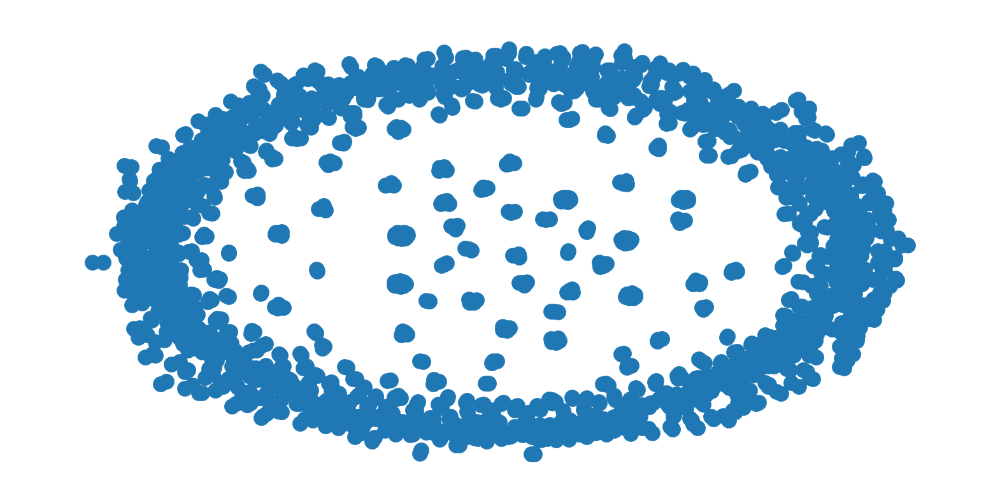

In [45]:

# Assuming 'graph' is your networkx graph
pos = nx.spring_layout(graph)  # Compute the layout
ax = plt.gca()  # Get the current axes
nx.draw(graph, pos, ax=ax)


### Stuttgart 

In [46]:
# Extracting User Data from Businesses in Stuttgart City and Creating a User Network Graph

# Select businesses located in the city of Stuttgart
subset = business[business.city == 'Stuttgart']

# Perform an inner join of business data with review data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user IDs
subset_users = subset.user_id.unique()

# Create a DataFrame for user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Inner join the user IDs with the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a list of friends
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

subset_users.shape


(282, 24)

In [47]:
# Extract User IDs and Friends List
subset_users_list = subset_users[['user_id', 'list_friends']]

# Expand the friends list into multiple columns
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Rename columns to fit network graph import
network_data.columns = ['source', 'level_1', 'target']

In [48]:
graph=nx.from_pandas_edgelist(network_data)
#basic info
print(f"Graph with {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges")

#check density
print("The density of the graph is ",nx.density(graph))

Graph with 31979 nodes and 43839 edges
The density of the graph is  8.573821892400615e-05


In [49]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle that much nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

#recreate the subgraph from the updated graph
influencers_sub_graph_stuggart=graph.subgraph(influencers)

Graph with 486 nodes and 3678 edges
The density of the graph is  0.031207840142548047


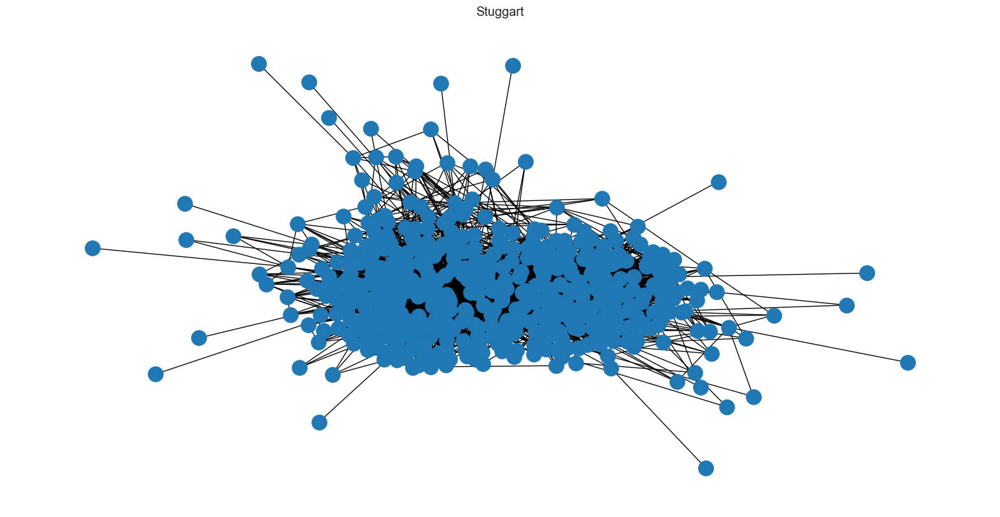

In [61]:

print(f"Graph with {influencers_sub_graph_stuggart.number_of_nodes()} nodes and {influencers_sub_graph_stuggart.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(influencers_sub_graph_stuggart))

pos = nx.spring_layout(influencers_sub_graph_stuggart)
ax=plt.gca()
nx.draw(influencers_sub_graph_stuggart,pos,ax=ax)
ax.set_title("Stuggart")
plt.show()


### Las Vegas

In [51]:
# Extracting User Data from Businesses in Las Vegas and Creating a User Network Graph

# Select businesses located in the city of Stuttgart
subset = business[business.city == 'Las Vegas']

# Perform an inner join of business data with review data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user IDs
subset_users = subset.user_id.unique()

# Create a DataFrame for user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Inner join the user IDs with the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a list of friends
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

subset_users.shape

(79164, 24)

In [52]:
# Extract User IDs and Friends List
subset_users_list = subset_users[['user_id', 'list_friends']]

# Expand the friends list into multiple columns
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Rename columns to fit network graph import
network_data.columns = ['source', 'level_1', 'target']

graph=nx.from_pandas_edgelist(network_data)
#basic info
print(f"Graph with {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(graph))


Graph with 3123464 nodes and 11590336 edges
The density of the graph is  2.37603673788159e-06


In [53]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle that much nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

#recreate the subgraph from the updated graph
influencers_sub_graph_vegas=graph.subgraph(influencers)

Graph with 493 nodes and 7144 edges
The density of the graph is  0.05890598459737133


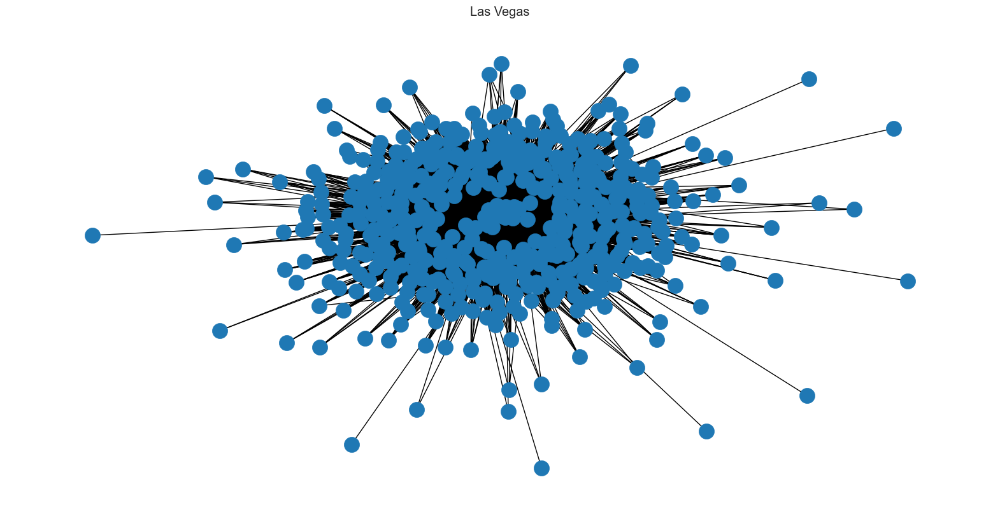

In [54]:
print(f"Graph with {influencers_sub_graph_vegas.number_of_nodes()} nodes and {influencers_sub_graph_vegas.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(influencers_sub_graph_vegas))

pos = nx.spring_layout(influencers_sub_graph_vegas)
ax=plt.gca()
nx.draw(influencers_sub_graph_vegas,pos,ax=ax)
ax.set_title("Las Vegas")
plt.show()

### Phoenix

In [55]:
# Extracting User Data from Businesses in Phoenix and Creating a User Network Graph

# Select businesses located in the city of Phoenix
subset = business[business.city == 'Phoenix']

# Perform an inner join of business data with review data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user IDs
subset_users = subset.user_id.unique()

# Create a DataFrame for user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Inner join the user IDs with the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a list of friends
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

subset_users.shape

(28723, 24)

In [56]:
# Extract User IDs and Friends List
subset_users_list = subset_users[['user_id', 'list_friends']]

# Expand the friends list into multiple columns
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Rename columns to fit network graph import
network_data.columns = ['source', 'level_1', 'target']

graph=nx.from_pandas_edgelist(network_data)
#basic info
print(f"Graph with {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(graph))

Graph with 1261435 nodes and 3229898 edges
The density of the graph is  4.059657487930209e-06


Graph with 442 nodes and 1781 edges
The density of the graph is  0.018273976257169533


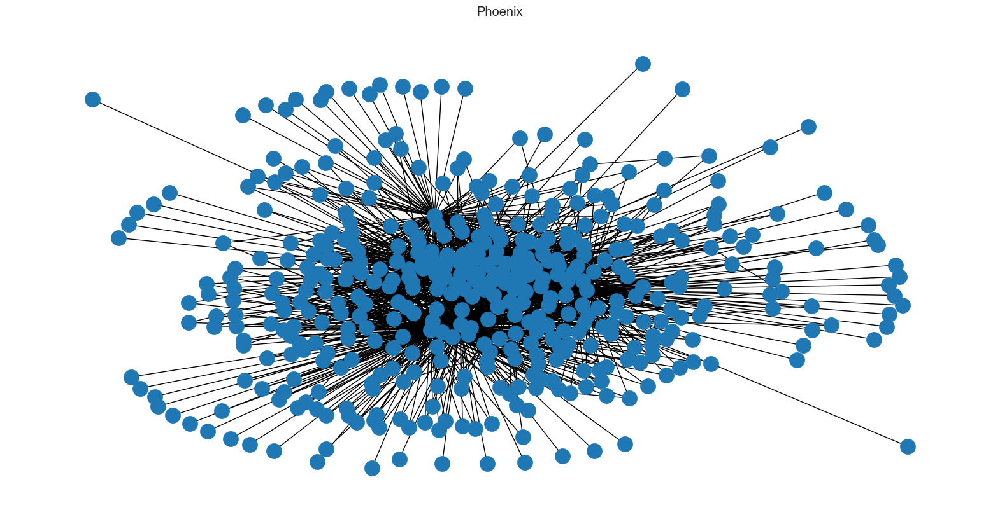

In [58]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle that much nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

#recreate the subgraph from the updated graph
influencers_sub_graph_phoe=graph.subgraph(influencers)


print(f"Graph with {influencers_sub_graph_phoe.number_of_nodes()} nodes and {influencers_sub_graph_phoe.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(influencers_sub_graph_phoe))

pos = nx.spring_layout(influencers_sub_graph_phoe)
ax=plt.gca()
nx.draw(influencers_sub_graph_phoe,pos,ax=ax)
ax.set_title("Phoenix")
plt.show()

### Edinburgh

In [59]:
# Extracting User Data from Businesses in Edinburgh and Creating a User Network Graph

# Select businesses located in the city of Phoenix
subset = business[business.city == 'Edinburgh']

# Perform an inner join of business data with review data
subset = pd.merge(subset, reviews, how='inner', on='business_id')

# Extract unique user IDs
subset_users = subset.user_id.unique()

# Create a DataFrame for user IDs
subset_users = pd.DataFrame(subset_users, columns=['user_id'])

# Inner join the user IDs with the user dataset
subset_users = pd.merge(subset_users, user, how='inner', on='user_id')

# Create a list of friends
subset_users['list_friends'] = subset_users["friends"].apply(lambda x: str(x).split(','))
subset_users['count_friends'] = subset_users["list_friends"].apply(lambda x: len(x))

subset_users.shape

(1542, 24)

In [60]:
# Extract User IDs and Friends List
subset_users_list = subset_users[['user_id', 'list_friends']]

# Expand the friends list into multiple columns
network_data = subset_users_list.set_index(['user_id'])['list_friends'].apply(pd.Series).stack()
network_data = network_data.reset_index()

# Rename columns to fit network graph import
network_data.columns = ['source', 'level_1', 'target']

graph=nx.from_pandas_edgelist(network_data)
#basic info
print(f"Graph with {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(graph))

Graph with 165990 nodes and 276946 edges
The density of the graph is  2.010313823953251e-05


Graph with 355 nodes and 1768 edges
The density of the graph is  0.02813718469006127


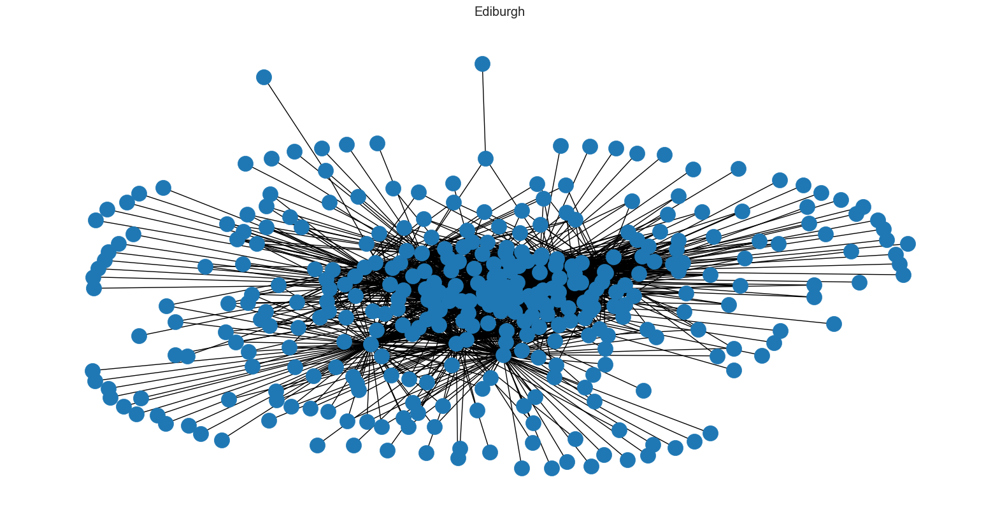

In [62]:
#use degree-centrality to find out influencers in the selected region
x=nx.degree_centrality(graph)
#Creating a subset again as we cant handle 70k nodes, unfortunately.

#Using heapq to find the 500 most connected nodes (ie) peeple with the most connections
influencers=heapq.nlargest(500, x, key=x.get)

#creating a sub-graph as I'm not able to create the layout positions without killing the kernal
influencers_sub_graph=graph.subgraph(influencers)

# Check for isolates ( nodes with no edges (ie) users without friends in the sub-graph)
# graph=graph.remove_nodes_from(nx.isolates(graph))
list_of_nodes_to_be_removed=[x for x in nx.isolates(influencers_sub_graph)]

# remove the selected isolates from the main graph
graph.remove_nodes_from(list_of_nodes_to_be_removed)

#recreate the subgraph from the updated graph
influencers_sub_graph_Edi=graph.subgraph(influencers)


print(f"Graph with {influencers_sub_graph_Edi.number_of_nodes()} nodes and {influencers_sub_graph_Edi.number_of_edges()} edges")
#check density
print("The density of the graph is ",nx.density(influencers_sub_graph_Edi))

pos = nx.spring_layout(influencers_sub_graph_Edi)
ax=plt.gca()
nx.draw(influencers_sub_graph_Edi,pos,ax=ax)
ax.set_title("Ediburgh")
plt.show()

## Network Visulizatioin:

### Spring layout

Stuttgart

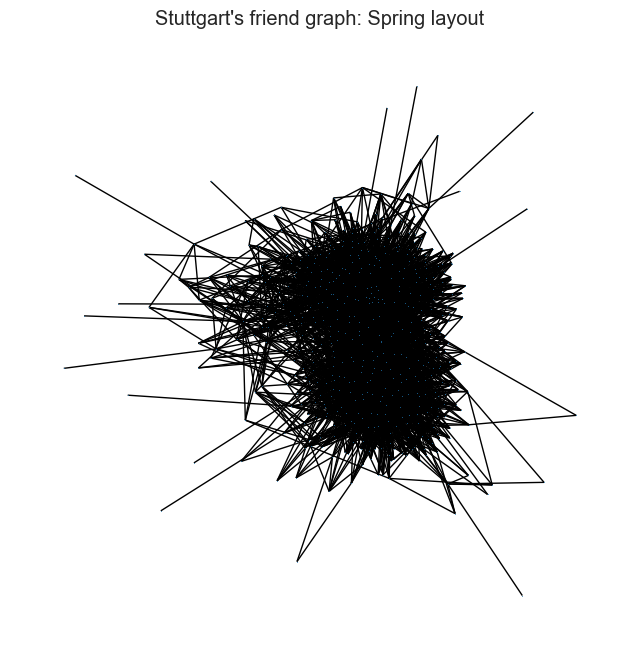

In [63]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph_stuggart)
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Stuttgart's friend graph: Spring layout")
nx.draw(influencers_sub_graph_stuggart, pos, ax=ax,node_size=0.05, width=1)

Las Vegas

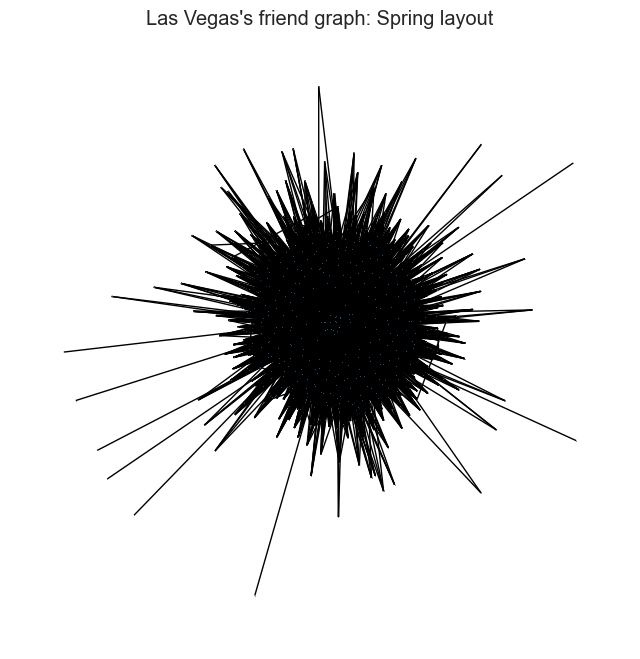

In [64]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph_vegas)
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Las Vegas's friend graph: Spring layout")
nx.draw(influencers_sub_graph_vegas, pos, ax=ax,node_size=0.05, width=1)

Phoenix

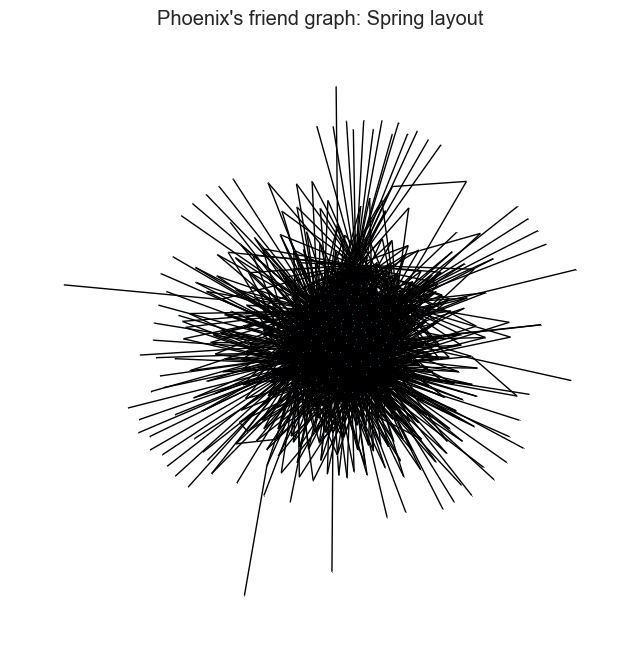

In [65]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph_phoe)
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Phoenix's friend graph: Spring layout")
nx.draw(influencers_sub_graph_phoe, pos, ax=ax,node_size=0.05, width=1)

Edinburgh

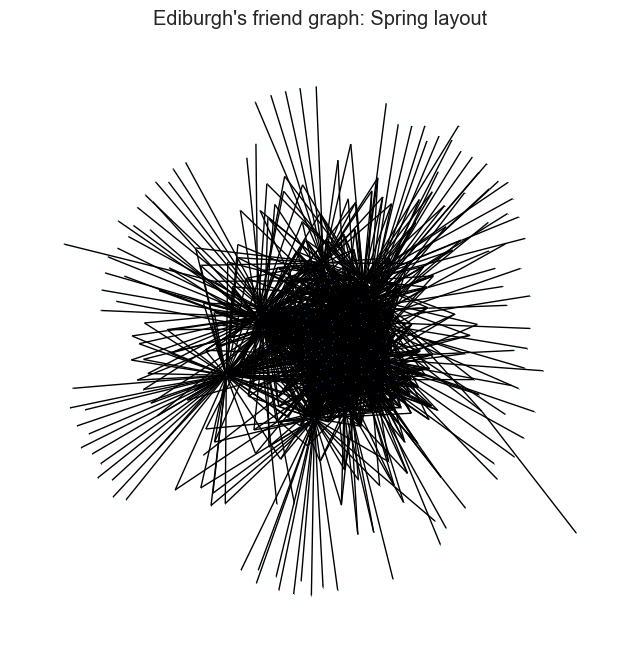

In [66]:
# create the layout
pos = nx.spring_layout(influencers_sub_graph_Edi)
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Ediburgh's friend graph: Spring layout")
nx.draw(influencers_sub_graph_Edi, pos, ax=ax,node_size=0.05, width=1)

The structure of the graph above shows the community of users in each city and their connections.

Let's explore other possible views with networkx.I will just use Stuggart to build other Network graphs. 

### Circular/Circos

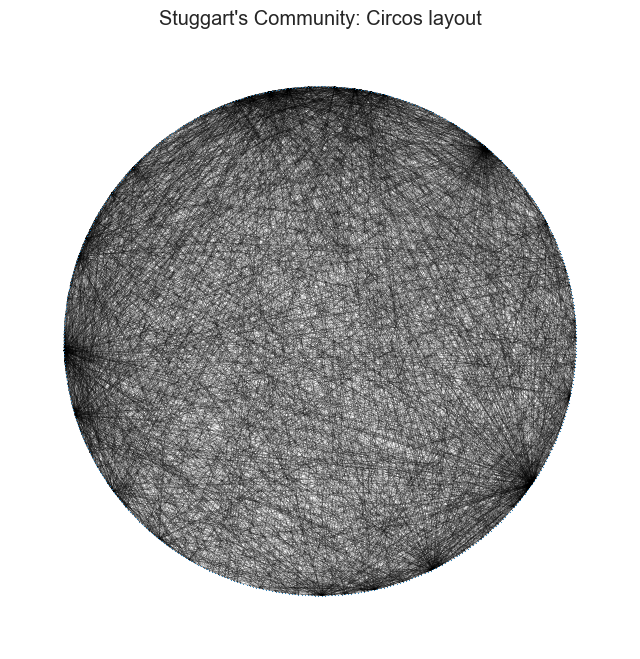

In [67]:

plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Stuggart's Community: Circos layout")
nx.draw_circular(influencers_sub_graph_stuggart, ax=ax,node_size=0.1, width=0.1)

Random Layout

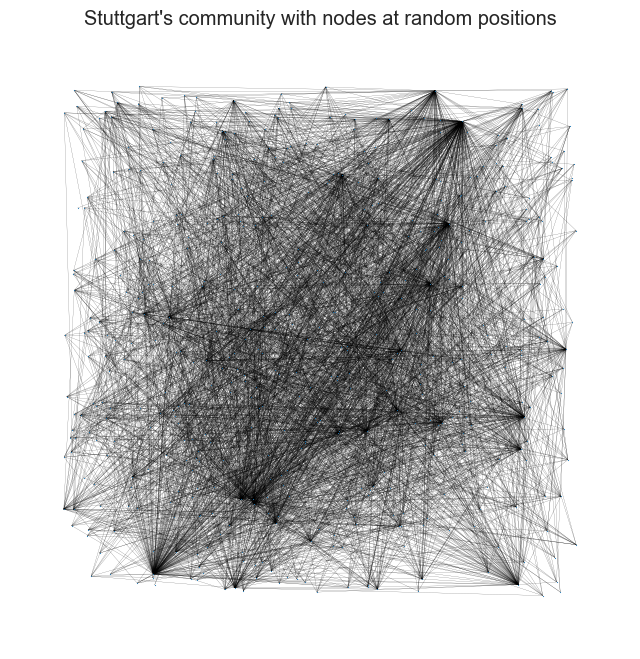

In [68]:
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Stuttgart's community with nodes at random positions")
nx.draw_random(influencers_sub_graph_stuggart,ax=ax,node_size=0.1, width=0.1)

Kamada-Kawai

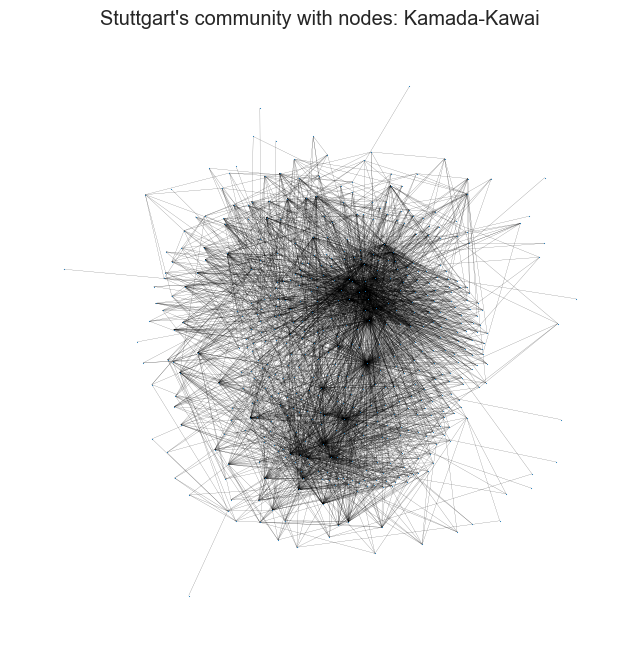

In [69]:
plt.figure(figsize=(8,8))
ax=plt.gca()
plt.title("Stuttgart's community with nodes: Kamada-Kawai")
nx.draw_kamada_kawai(influencers_sub_graph_stuggart,ax=ax,node_size=0.1, width=0.1)

## Community Detection

Identify influential potential communities in Stuttgart, Las Vegas, Phoenix, and Edinburgh and overlay the detected communities on the chart's spring layout."

In [70]:
pip install -U python-louvain


Note: you may need to restart the kernel to use updated packages.


In [81]:
import community as community_louvain


### Stuttgart's Communities

In [135]:
parts = community_louvain.best_partition(influencers_sub_graph_stuggart)
values = [parts.get(node) for node in influencers_sub_graph_stuggart.nodes()]
print(len(set(values)), "Communities have been identified")


4 Communities have been identified


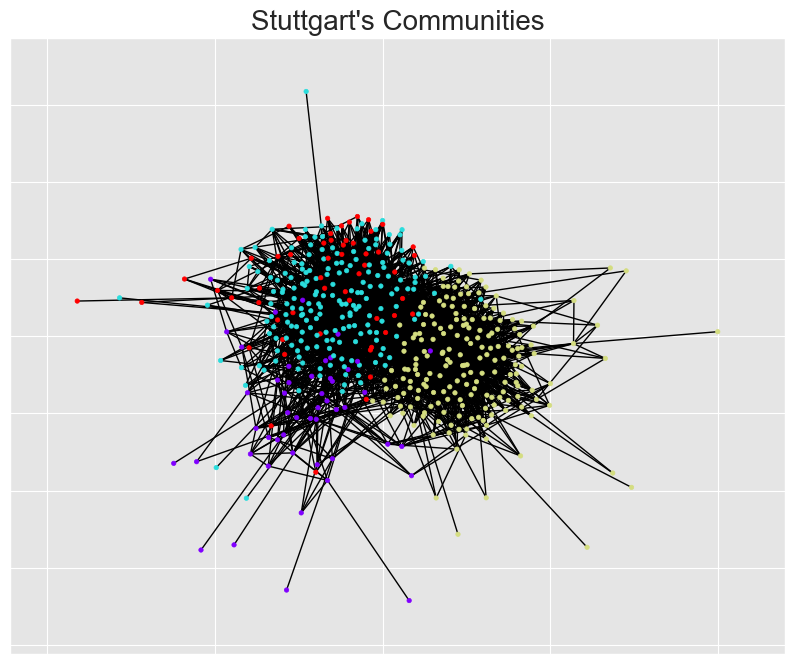

In [136]:
pos = nx.spring_layout(influencers_sub_graph_stuggart)

plt.figure(figsize=(10, 8))
plt.title("Stuttgart's Communities", fontsize=20)

# Use the same 'pos' for drawing
nx.draw_networkx(influencers_sub_graph_stuggart, pos=pos, cmap=plt.get_cmap("rainbow"),
                 node_color=values, node_size=10, with_labels=False)

plt.show()

### Las Vegas Communities

In [143]:
parts = community_louvain.best_partition(influencers_sub_graph_vegas)
values = [parts.get(node) for node in influencers_sub_graph_vegas.nodes()]
print(len(set(values)), "Communities have been identified")

5 Communities have been identified


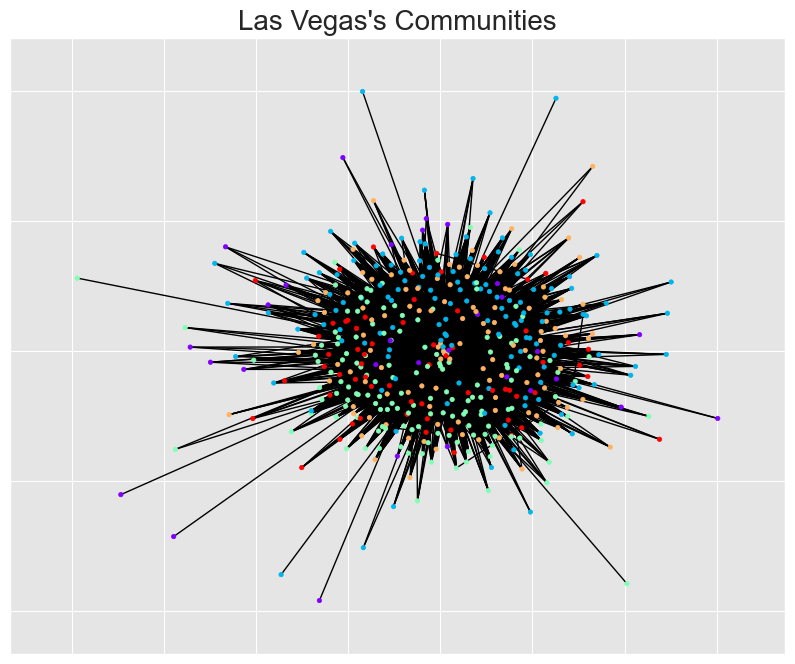

In [144]:
pos = nx.spring_layout(influencers_sub_graph_vegas)

plt.figure(figsize=(10, 8))
plt.title("Las Vegas's Communities", fontsize=20)

# Use the same 'pos' for drawing
nx.draw_networkx(influencers_sub_graph_vegas, pos=pos, cmap=plt.get_cmap("rainbow"),
                 node_color=values, node_size=10, with_labels=False)

plt.show()

### Phoenix's communities

In [149]:
parts = community_louvain.best_partition(influencers_sub_graph_phoe)
values = [parts.get(node) for node in influencers_sub_graph_phoe.nodes()]
print(len(set(values)), "Communities have been identified")

8 Communities have been identified


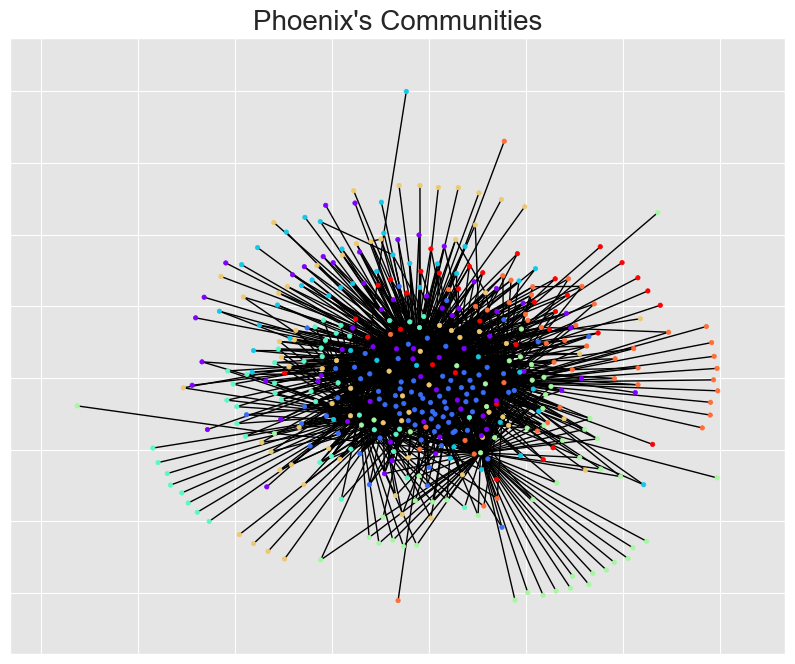

In [150]:
pos = nx.spring_layout(influencers_sub_graph_phoe)

plt.figure(figsize=(10, 8))
plt.title("Phoenix's Communities", fontsize=20)

# Use the same 'pos' for drawing
nx.draw_networkx(influencers_sub_graph_phoe, pos=pos, cmap=plt.get_cmap("rainbow"),
                 node_color=values, node_size=10, with_labels=False)

plt.show()

### Edinburgh's communities

In [155]:
parts = community_louvain.best_partition(influencers_sub_graph_Edi)
values = [parts.get(node) for node in influencers_sub_graph_Edi.nodes()]
print(len(set(values)), "Communities have been identified")

5 Communities have been identified


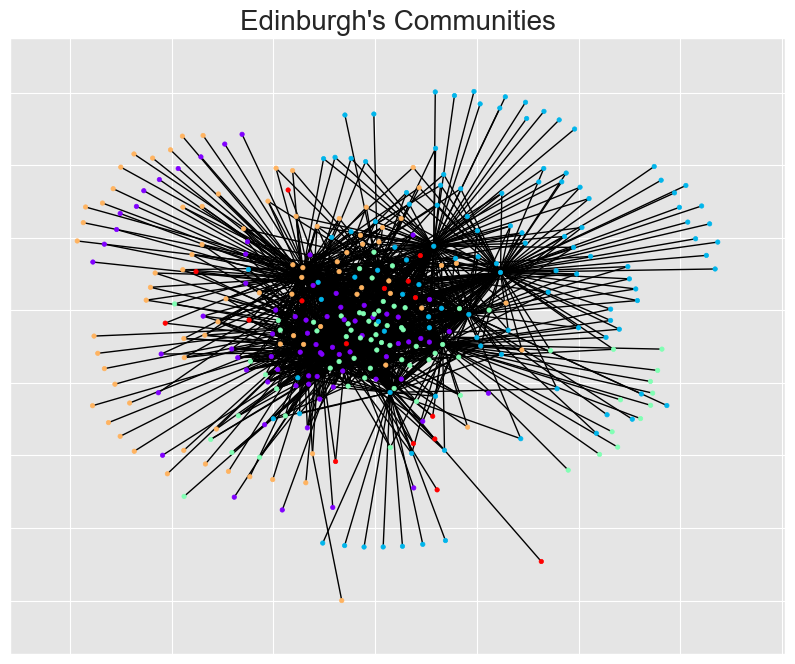

In [156]:
pos = nx.spring_layout(influencers_sub_graph_Edi)

plt.figure(figsize=(10, 8))
plt.title("Edinburgh's Communities", fontsize=20)

# Use the same 'pos' for drawing
nx.draw_networkx(influencers_sub_graph_Edi, pos=pos, cmap=plt.get_cmap("rainbow"),
                 node_color=values, node_size=10, with_labels=False)

plt.show()